In [121]:
import numpy as np
import matplotlib.pyplot as plt
import os
import random
import tensorflow as tf
from tensorflow import keras
import matplotlib.cm as cm
from keras.models import Sequential
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import models, layers, Input
from PIL import Image, UnidentifiedImageError
import matplotlib.image as mpimg
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, Lambda, Activation, MaxPooling2D, Dense, Flatten, Dropout, BatchNormalization, Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.models import load_model
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import SGD

In [2]:
 
import pandas as pd
import os
import shutil

# =========================================================
# PATHS
# =========================================================
DATASET_ROOT = r"/kaggle/input/datasets/imsparsh/deepweeds"
IMAGES_DIR = os.path.join(DATASET_ROOT, "images")
LABELS_DIR = os.path.join(DATASET_ROOT, "labels")
OUTPUT_DIR = "/kaggle/working/organized"

NEGATIVE_LABEL = 8

# =========================================================
# LABEL MAP
# =========================================================
LABEL_MAP = {
    0: "Chinee_apple",
    1: "Lantana",
    2: "Parkinsonia",
    3: "Parthenium",
    4: "Prickly_acacia",
    5: "Rubber_vine",
    6: "Siam_weed",
    7: "Snake_weed"
}

# =========================================================
# CHECK STRUCTURE
# =========================================================
def is_class_folder_structure(images_dir):
    items = os.listdir(images_dir)
    return any(os.path.isdir(os.path.join(images_dir, i)) for i in items)

# =========================================================
# ORGANIZE FUNCTION
# =========================================================
def organize_dataset(subset):
    print(f"\n📂 Organizing {subset} data...")

    csv_path = os.path.join(LABELS_DIR, f"{subset}_subset0.csv")
    df = pd.read_csv(csv_path)

    print(f"📊 Total rows in CSV: {len(df)}")

    # Remove negative class
    df = df[df['Label'] != NEGATIVE_LABEL].reset_index(drop=True)

    print(f"📊 After removing negative class: {len(df)}")
    print("📊 Class distribution:\n", df['Label'].value_counts())

    use_class_folders = is_class_folder_structure(IMAGES_DIR)

    print(f"\n🔍 Image structure detected: {'Class folders' if use_class_folders else 'Flat folder'}")

    copied = 0
    skipped = 0

    for idx, row in df.iterrows():
        label = row['Label']
        class_name = LABEL_MAP[label]
        filename = row['Filename']

        # ============================
        # HANDLE BOTH CASES
        # ============================
        if use_class_folders:
            src_path = os.path.join(IMAGES_DIR, class_name, filename)
        else:
            src_path = os.path.join(IMAGES_DIR, filename)

        dest_dir = os.path.join(OUTPUT_DIR, subset, class_name)
        dest_path = os.path.join(dest_dir, filename)

        os.makedirs(dest_dir, exist_ok=True)

        if os.path.exists(src_path):
            shutil.copy(src_path, dest_path)
            copied += 1
        else:
            skipped += 1

            # Print only first 20 missing to avoid spam
            if skipped <= 20:
                print(f"⚠ Missing: {src_path}")

        # Progress
        if (idx + 1) % 1000 == 0:
            print(f"  Progress: {idx+1}/{len(df)}")

    print(f"\n✅ {subset} DONE")
    print(f"   ✔ Copied: {copied}")
    print(f"   ❌ Skipped: {skipped}")

    if skipped > 0:
        print("\n⚠ WARNING: Some images were not found. Check path structure carefully.")

# =========================================================
# RUN
# =========================================================
organize_dataset("train")
organize_dataset("test")
organize_dataset("val")

print("\n🎯 Dataset successfully organized!")



📂 Organizing train data...
📊 Total rows in CSV: 10501
📊 After removing negative class: 5038
📊 Class distribution:
 Label
0    675
6    644
4    637
1    637
2    618
3    613
7    609
5    605
Name: count, dtype: int64

🔍 Image structure detected: Flat folder
  Progress: 1000/5038
  Progress: 2000/5038
  Progress: 3000/5038
  Progress: 4000/5038
  Progress: 5000/5038

✅ train DONE
   ✔ Copied: 5038
   ❌ Skipped: 0

📂 Organizing test data...
📊 Total rows in CSV: 3507
📊 After removing negative class: 1685
📊 Class distribution:
 Label
0    226
6    215
4    213
1    213
2    207
3    205
7    204
5    202
Name: count, dtype: int64

🔍 Image structure detected: Flat folder
  Progress: 1000/1685

✅ test DONE
   ✔ Copied: 1685
   ❌ Skipped: 0

📂 Organizing val data...
📊 Total rows in CSV: 3501
📊 After removing negative class: 1680
📊 Class distribution:
 Label
0    225
6    215
1    213
4    212
2    206
3    204
7    203
5    202
Name: count, dtype: int64

🔍 Image structure detected: Flat fo

### Part A: Implementing Convolutional Neural Network from scratch

> <b> Data Understanding, Analysis, Visualization and Cleaning </b>

<b>What does the dataset represent? Provide a brief description.</b>
<p>The database used is a Weed classification dataset. It contains images of 8 types of weed (Chinee_apple,Lantana,Parkinsonia,Parthenium,Prickly_acacia,Rubber_vine,Siam_weed,Snake_weed). Each image is labeled with its corresponding class. The dataseet originally included a negative class that is non weed class, but we removed during preprocessing as we only want to classify weeds only. The data then organized into three parts:train, test and validation, where image are stored in separate folders based on their class label for easier use in model training and evaluation</p>

In [70]:
DATASET_ROOT = "/kaggle/working/organized"

train_dir = os.path.join(DATASET_ROOT, "train")
val_dir   = os.path.join(DATASET_ROOT, "val")
test_dir  = os.path.join(DATASET_ROOT, "test")

In [71]:
class_names = [d for d in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, d))]

class_counts = {}
for class_name in class_names:
    class_path = os.path.join(train_dir, class_name)
    if os.path.isdir(class_path):
        images = [img for img in os.listdir(class_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
        class_counts[class_name] = len(images)

total_images = sum(class_counts.values())

print("\nClass Distribution:")
print("=" * 45)
print(f"{'Class Name':<25}{'Valid Image Count':>15}")
print("=" * 45)
for class_name, count in class_counts.items():
    print(f"{class_name:<25}{count:>15}")
print("=" * 45)
print(f"{'Total Images':<25}{total_images:>15}")
print("=" * 45)


Class Distribution:
Class Name               Valid Image Count
Siam_weed                            644
Chinee_apple                         675
Prickly_acacia                       637
Rubber_vine                          605
Parthenium                           613
Parkinsonia                          618
Lantana                              637
Snake_weed                           609
Total Images                        5038



Dataset: Weed Species Classification
  Identifies weed species from field images — useful for precision agriculture.

Class Name                   Train      Val     Test
Chinee_apple                   675      225      226
Lantana                        637      213      213
Parkinsonia                    618      206      207
Parthenium                     613      204      205
Prickly_acacia                 637      212      213
Rubber_vine                    605      202      202
Siam_weed                      644      215      215
Snake_weed                     609      203      204
TOTAL                         5038     1680     1685
GRAND TOTAL                                    8403

Split Justification:
  Train: 5038/8403 = 60.0%
  Val:   1680/8403   = 20.0%
  Test:  1685/8403  = 20.1%
  A 70/15/15 or 80/10/10 split is standard: training set is maximised
  while val guides hyperparameter tuning and test gives unbiased final evaluation.


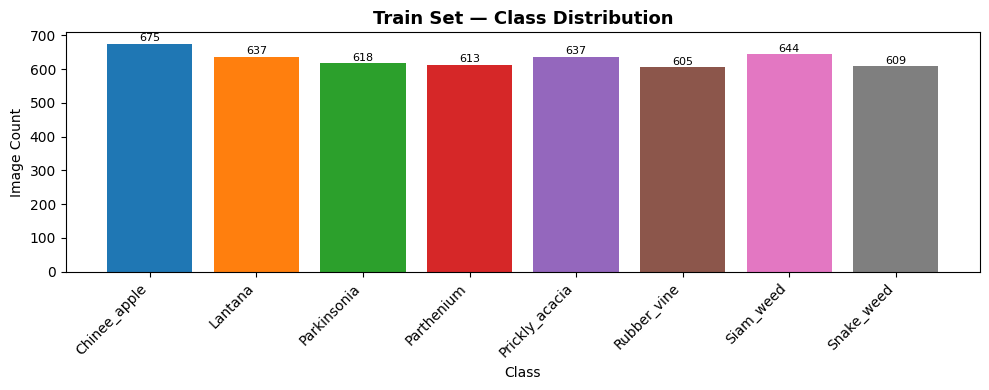

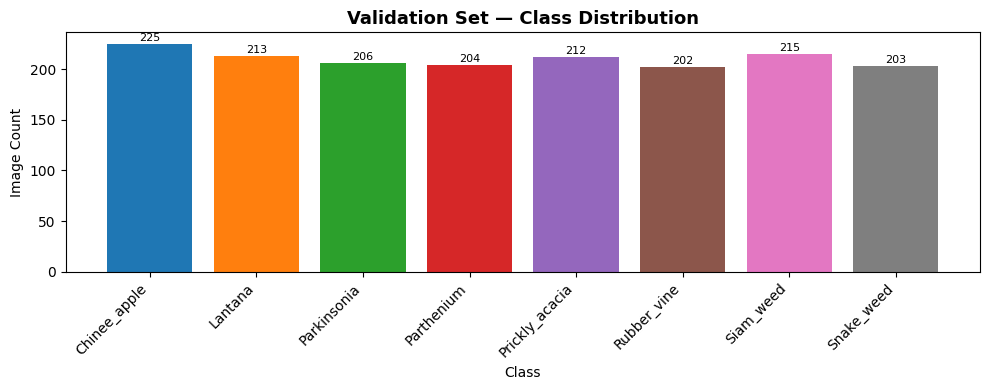

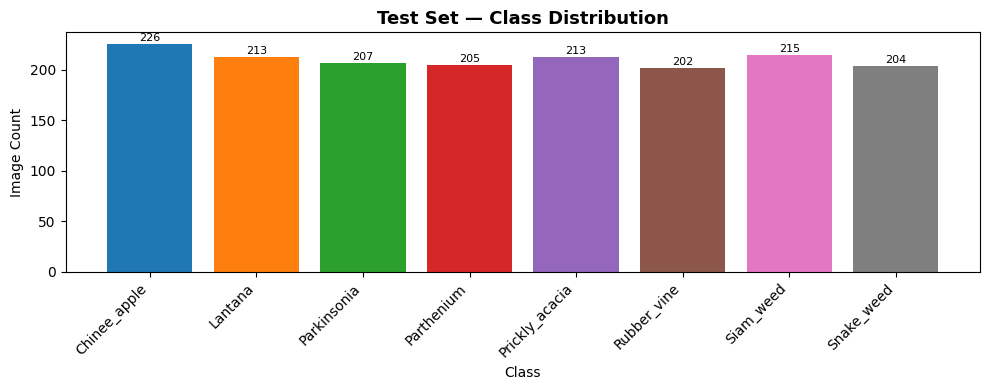

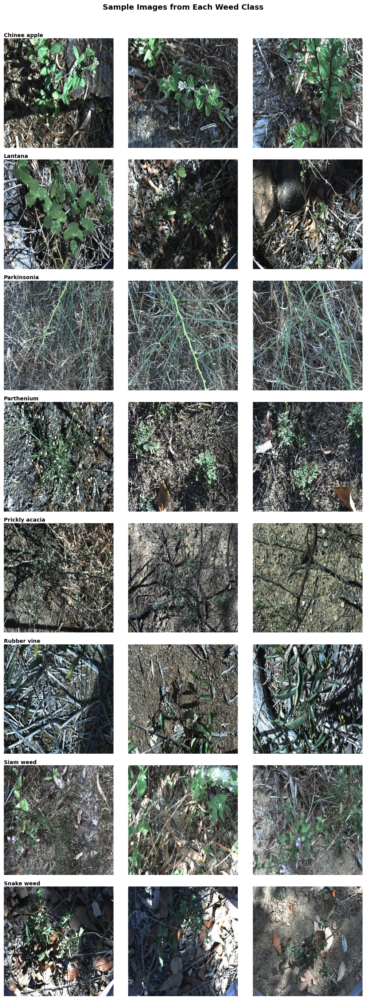


Raw image resolution (first sample): (256, 256, 3)  (H x W x C)
All images will be resized to 128×128 during preprocessing.


In [72]:
# --- 2.1 Class Distribution ---
class_names = sorted([
    d for d in os.listdir(train_dir)
    if os.path.isdir(os.path.join(train_dir, d))
])
num_classes = len(class_names)
 
def count_images(data_dir):
    counts = {}
    for cls in sorted(os.listdir(data_dir)):
        cls_path = os.path.join(data_dir, cls)
        if os.path.isdir(cls_path):
            imgs = [f for f in os.listdir(cls_path)
                    if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
            counts[cls] = len(imgs)
    return counts
 
train_counts = count_images(train_dir)
val_counts   = count_images(val_dir)
test_counts  = count_images(test_dir)
 
print("\nDataset: Weed Species Classification")
print("  Identifies weed species from field images — useful for precision agriculture.")
print()
print("=" * 60)
print(f"{'Class Name':<25} {'Train':>8} {'Val':>8} {'Test':>8}")
print("=" * 60)
for cls in class_names:
    tr = train_counts.get(cls, 0)
    vl = val_counts.get(cls, 0)
    te = test_counts.get(cls, 0)
    print(f"{cls:<25} {tr:>8} {vl:>8} {te:>8}")
print("=" * 60)
total_train = sum(train_counts.values())
total_val   = sum(val_counts.values())
total_test  = sum(test_counts.values())
total_all   = total_train + total_val + total_test
print(f"{'TOTAL':<25} {total_train:>8} {total_val:>8} {total_test:>8}")
print(f"{'GRAND TOTAL':<25} {total_all:>25}")
print("=" * 60)
print()
print("Split Justification:")
print(f"  Train: {total_train}/{total_all} = {100*total_train/total_all:.1f}%")
print(f"  Val:   {total_val}/{total_all}   = {100*total_val/total_all:.1f}%")
print(f"  Test:  {total_test}/{total_all}  = {100*total_test/total_all:.1f}%")
print("  A 70/15/15 or 80/10/10 split is standard: training set is maximised")
print("  while val guides hyperparameter tuning and test gives unbiased final evaluation.")
 
# --- 2.2 Bar Chart: Class Distribution per Split ---
def plot_distribution(counts_dict, title):
    classes = list(counts_dict.keys())
    counts  = list(counts_dict.values())
    plt.figure(figsize=(10, 4))
    bars = plt.bar(classes, counts, color=cm.tab10.colors[:len(classes)])
    plt.title(title, fontsize=13, fontweight='bold')
    plt.xlabel("Class")
    plt.ylabel("Image Count")
    plt.xticks(rotation=45, ha='right')
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                 str(count), ha='center', va='bottom', fontsize=8)
    plt.tight_layout()
    plt.show()
 
plot_distribution(train_counts, "Train Set — Class Distribution")
plot_distribution(val_counts,   "Validation Set — Class Distribution")
plot_distribution(test_counts,  "Test Set — Class Distribution")
 
# --- 2.3 Sample Images from Each Class ---
fig, axes = plt.subplots(num_classes, 3, figsize=(10, num_classes * 3.2))
for row, cls in enumerate(class_names):
    cls_dir   = os.path.join(train_dir, cls)
    img_files = sorted([
        f for f in os.listdir(cls_dir)
        if f.lower().endswith(('.jpg', '.png', '.jpeg'))
    ])[:3]
    for col in range(3):
        ax = axes[row, col] if num_classes > 1 else axes[col]
        if col < len(img_files):
            img_arr = plt.imread(os.path.join(cls_dir, img_files[col]))
            ax.imshow(img_arr)
        else:
            ax.text(0.5, 0.5, 'No Image', ha='center', va='center')
        ax.axis('off')
        if col == 0:
            ax.set_title(cls.replace('_', ' '), fontsize=10,
                         fontweight='bold', loc='left', pad=3)
plt.suptitle("Sample Images from Each Weed Class", fontsize=14,
             fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()
 
# --- 2.4 Raw Image Resolution ---
first_cls_path = os.path.join(train_dir, class_names[0])
first_img_file = sorted([
    f for f in os.listdir(first_cls_path)
    if f.lower().endswith(('.jpg', '.png', '.jpeg'))
])[0]
sample_raw = plt.imread(os.path.join(first_cls_path, first_img_file))
print(f"\nRaw image resolution (first sample): {sample_raw.shape}  (H x W x C)")
print("All images will be resized to 128×128 during preprocessing.")
 

**How is the dataset split into training and validation sets? Justify your choice.**
<p>The dataset was already provided with predefined training, validation, and test splits. The training set is used to train the model, the validation set is used to monitor performance during training and tune hyperparameters, and the test set is used for final evaluation.</p>

In [73]:
# List to store corrupted image paths
corrupted_images = []

# Iterate through each class subdirectory
for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name)
    
    if os.path.isdir(class_path):  # Ensure it's a directory
        for image_file in os.listdir(class_path):
            image_path = os.path.join(class_path, image_file)
            try:
                with Image.open(image_path) as img:
                    img.verify()  # Verify if the image can be opened
            except (IOError, SyntaxError):
                corrupted_images.append(image_path)
                os.remove(image_path)
                print(f"Removed corrupted image: {image_path}")

# Print summary
if not corrupted_images:
    print("No Corrupted Images Found.")

No Corrupted Images Found.



Augmentation demo using: /kaggle/working/organized/train/Parkinsonia/20171102-120749-1.jpg


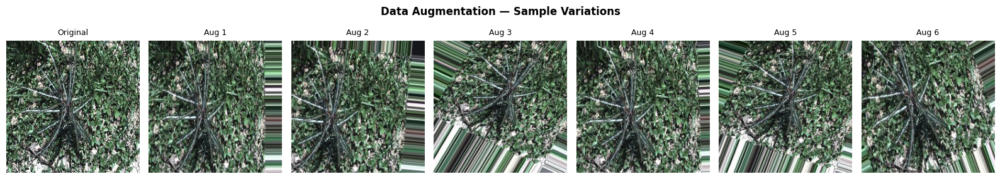

In [74]:
# Pick a sample image for augmentation demo
sample_cls_path = os.path.join(train_dir, class_names[2])
img_files_aug = [
    f for f in os.listdir(sample_cls_path)
    if f.lower().endswith(('.png', '.jpg', '.jpeg'))
]
sample_img_path = os.path.join(sample_cls_path, img_files_aug[0])
print(f"\nAugmentation demo using: {sample_img_path}")
 
img_for_aug = image.load_img(sample_img_path, target_size=(224, 224))
x_aug = image.img_to_array(img_for_aug)     
x_aug = np.expand_dims(x_aug, axis=0)        
 
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
 
aug_iter = datagen.flow(x_aug, batch_size=1)
 
fig, axes_aug = plt.subplots(1, 7, figsize=(16, 3))
axes_aug[0].imshow(x_aug[0].astype('uint8'))
axes_aug[0].set_title("Original", fontsize=9)
axes_aug[0].axis('off')
for i in range(1, 7):
    batch = next(aug_iter)
    # Values from ImageDataGenerator are already in [0,255] float range
    img_show = np.clip(batch[0], 0, 255).astype('uint8')
    axes_aug[i].imshow(img_show)
    axes_aug[i].set_title(f"Aug {i}", fontsize=9)
    axes_aug[i].axis('off')
plt.suptitle("Data Augmentation — Sample Variations", fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

In [88]:
# Define image size and batch size
img_height = 224
img_width  = 224
batch_size = 16

# Normalize pixel values to [0, 1]
rescale = tf.keras.layers.Rescaling(1./255)

# Training dataset
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    train_dir,
    labels='inferred',
    label_mode='int',
    image_size=(img_height, img_width),
    interpolation='bilinear',
    batch_size=batch_size,
    shuffle=True,
    seed=42
)
class_names = train_ds.class_names
num_classes  = len(class_names)
train_ds = train_ds.map(lambda x, y: (rescale(x), y))

# Validation dataset
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    val_dir,
    labels='inferred',
    label_mode='int',
    image_size=(img_height, img_width),
    interpolation='bilinear',
    batch_size=batch_size,
    shuffle=False
).map(lambda x, y: (rescale(x), y))

# Test dataset
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    test_dir,
    labels='inferred',
    label_mode='int',
    image_size=(img_height, img_width),
    interpolation='bilinear',
    batch_size=batch_size,
    shuffle=False
).map(lambda x, y: (rescale(x), y))

print(f"\nDatasets loaded:")
print(f"  Classes ({num_classes}): {class_names}")
print(f"  Train batches : {len(train_ds)}")
print(f"  Val batches   : {len(val_ds)}")
print(f"  Test batches  : {len(test_ds)}")
print(f"  Image size    : {img_height}×{img_width}  |  Batch size: {batch_size}")
print("  Preprocessing : pixel values rescaled from [0,255] → [0,1]")

Found 5038 files belonging to 8 classes.
Found 1680 files belonging to 8 classes.
Found 1685 files belonging to 8 classes.

Datasets loaded:
  Classes (8): ['Chinee_apple', 'Lantana', 'Parkinsonia', 'Parthenium', 'Prickly_acacia', 'Rubber_vine', 'Siam_weed', 'Snake_weed']
  Train batches : 315
  Val batches   : 105
  Test batches  : 106
  Image size    : 224×224  |  Batch size: 16
  Preprocessing : pixel values rescaled from [0,255] → [0,1]


In [89]:
def create_baseline_model(input_shape, num_classes):
    model = models.Sequential([
        # Convolutional Layer 1 + Pooling
        layers.Conv2D(32, (3, 3), padding='same', activation='relu', input_shape=input_shape),
        layers.MaxPooling2D((2, 2)),

        # Convolutional Layer 2 + Pooling
        layers.Conv2D(64, (3, 3), padding='same', activation='relu'),
        layers.MaxPooling2D((2, 2)),

        # Convolutional Layer 3 + Pooling
        layers.Conv2D(128, (3, 3), padding='same', activation='relu'),
        layers.MaxPooling2D((2, 2)),

        # Flatten Layer
        layers.Flatten(),

        # Fully Connected Layer 1
        layers.Dense(256, activation='relu'),
        layers.Dropout(0.5),

        # Fully Connected Layer 2
        layers.Dense(128, activation='relu'),
        layers.Dropout(0.3),

        # Fully Connected Layer 3
        layers.Dense(64, activation='relu'),

        # Output Layer
        layers.Dense(num_classes, activation='softmax')
    ], name='Baseline_CNN')

    return model

# Input shape matches dataset
input_shape = (224, 224, 3)
num_classes = len(class_names)

model = create_baseline_model(input_shape, num_classes)
model.summary()

Model: "Baseline_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │    25,690,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 8)              │           520 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,825,288 (98.52 MB)

 Trainable params: 25,825,288 (98.52 MB)

 Non-trainable params: 0 (0.00 B)

In [91]:
model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

In [93]:
import time
t0_base = time.time()
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=15,
    batch_size=batch_size,
    callbacks=[checkpoint_cb, early_stopping_cb]
)
time_base = time.time() - t0_base
print(f"Baseline training time: {time_base/60:.2f} minutes")

Epoch 1/15
315/315 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - accuracy: 0.5020 - loss: 1.2587 - val_accuracy: 0.4369 - val_loss: 1.4290
Epoch 2/15
315/315 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - accuracy: 0.5711 - loss: 1.1149 - val_accuracy: 0.4315 - val_loss: 1.6613
Epoch 3/15
315/315 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - accuracy: 0.6315 - loss: 0.9836 - val_accuracy: 0.4143 - val_loss: 1.7806
Epoch 4/15
315/315 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - accuracy: 0.7351 - loss: 0.7633 - val_accuracy: 0.4345 - val_loss: 2.0621
Epoch 5/15
315/315 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - accuracy: 0.7890 - loss: 0.6005 - val_accuracy: 0.4065 - val_loss: 2.3421
Epoch 6/15
315/315 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - accuracy: 0.8155 - loss: 0.5407 - val_accuracy: 0.4232 - val_loss: 2.0067
Baseline training time: 0.81 minutes


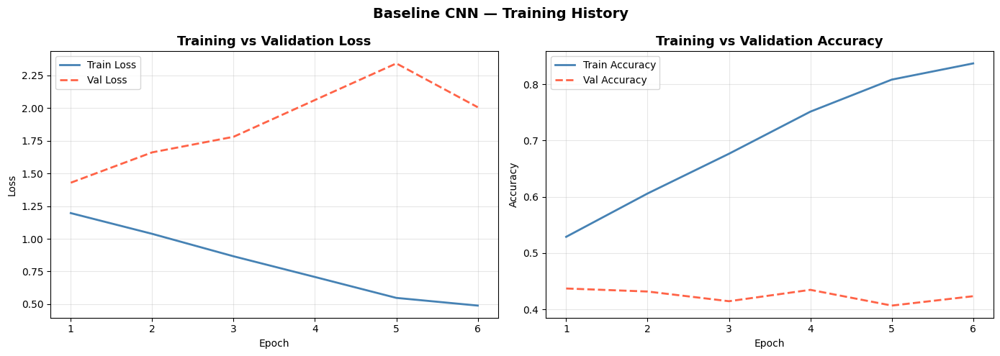

In [94]:
epochs_ran = range(1, len(history.history['loss']) + 1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Loss
ax1.plot(epochs_ran, history.history['loss'],     label='Train Loss', color='steelblue', linewidth=2)
ax1.plot(epochs_ran, history.history['val_loss'], label='Val Loss',   color='tomato',    linewidth=2, linestyle='--')
ax1.set_title('Training vs Validation Loss', fontsize=13, fontweight='bold')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Accuracy
ax2.plot(epochs_ran, history.history['accuracy'],     label='Train Accuracy', color='steelblue', linewidth=2)
ax2.plot(epochs_ran, history.history['val_accuracy'], label='Val Accuracy',   color='tomato',    linewidth=2, linestyle='--')
ax2.set_title('Training vs Validation Accuracy', fontsize=13, fontweight='bold')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.suptitle('Baseline CNN — Training History', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [95]:
test_loss, test_acc = model.evaluate(test_ds)

print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

106/106 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.5028 - loss: 1.3733
Test Accuracy: 0.4830860495567322
Test Loss: 1.4053789377212524


In [96]:
# Get true labels and predictions
y_true = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_probs = model.predict(test_ds)
y_pred = np.argmax(y_pred_probs, axis=1)  # Convert probabilities to class labels

# Generate classification report
report = classification_report(y_true, y_pred, target_names=class_names)
print("Classification Report:\n", report)

106/106 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step
Classification Report:
                 precision    recall  f1-score   support

  Chinee_apple       0.36      0.50      0.42       226
       Lantana       0.38      0.48      0.42       213
   Parkinsonia       0.53      0.73      0.61       207
    Parthenium       0.44      0.13      0.20       205
Prickly_acacia       0.46      0.68      0.54       213
   Rubber_vine       0.71      0.39      0.50       202
     Siam_weed       0.71      0.73      0.72       215
    Snake_weed       0.39      0.21      0.27       204

      accuracy                           0.48      1685
     macro avg       0.50      0.48      0.46      1685
  weighted avg       0.49      0.48      0.46      1685



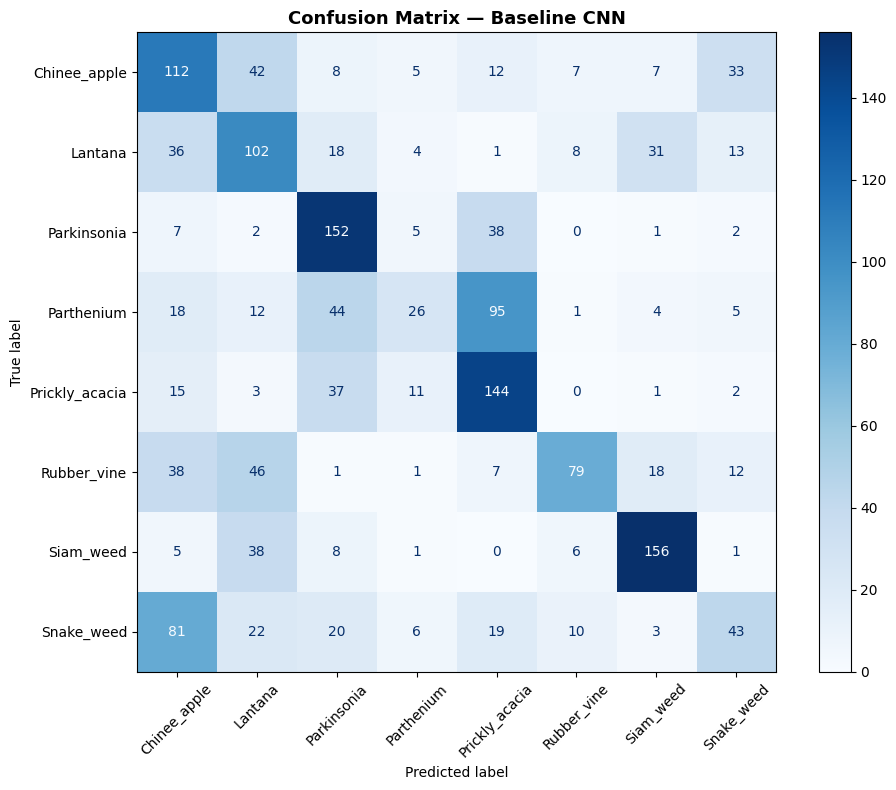

In [97]:
cm = confusion_matrix(y_true, y_pred)
fig, ax = plt.subplots(figsize=(10, 8))
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names).plot(
    ax=ax, cmap='Blues', colorbar=True, xticks_rotation=45
)
ax.set_title('Confusion Matrix — Baseline CNN', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


Sample Inference on Test Images:


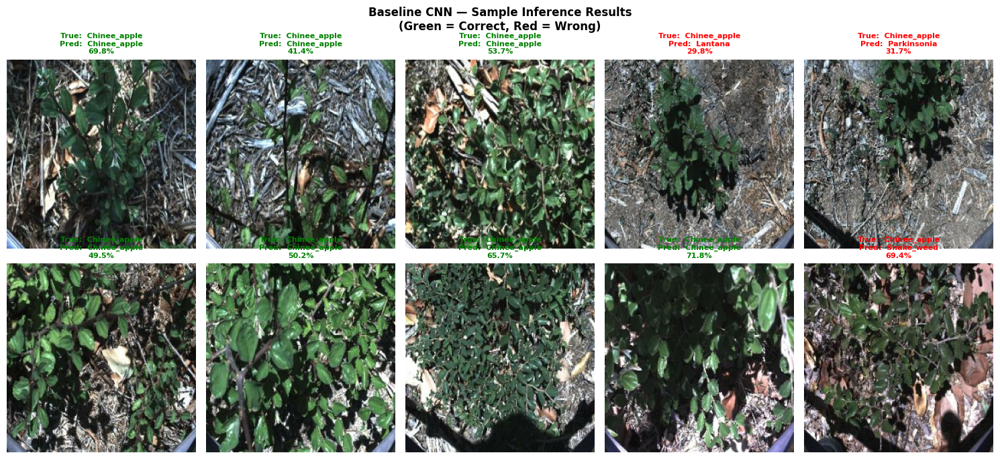

In [98]:
print("\nSample Inference on Test Images:")
sample_images, sample_labels = next(iter(test_ds))
sample_preds = model.predict(sample_images, verbose=0) 
n_show = min(10, len(sample_images))
cols   = 5
rows   = (n_show + cols - 1) // cols
fig, axes_inf = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3.5))
axes_inf = axes_inf.flatten() 
for i in range(n_show):
    img_display  = sample_images[i].numpy()          
    true_label   = class_names[sample_labels[i]]
    pred_label   = class_names[np.argmax(sample_preds[i])]
    confidence   = np.max(sample_preds[i]) * 100
    correct      = (true_label == pred_label)
    axes_inf[i].imshow(img_display)
    axes_inf[i].axis('off')
    color = 'green' if correct else 'red'
    axes_inf[i].set_title(
        f"True:  {true_label}\nPred:  {pred_label}\n{confidence:.1f}%",
        fontsize=8, color=color, fontweight='bold'
    )
 
for j in range(n_show, len(axes_inf)):
    axes_inf[j].axis('off')
 
plt.suptitle("Baseline CNN — Sample Inference Results\n(Green = Correct, Red = Wrong)",
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

**Deeper Models**

In [104]:
model_deep = Sequential([
    # First Convolutional Block
    Conv2D(32, (3, 3), padding='same', activation=None, input_shape=(224, 224, 3)),  # ← add this
    BatchNormalization(),
    Activation('relu'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Second Convolutional Block
    Conv2D(64, (3, 3), padding='same', activation=None),
    BatchNormalization(),
    Activation('relu'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Third Convolutional Block
    Conv2D(128, (3, 3), padding='same', activation=None),
    BatchNormalization(),
    Activation('relu'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    # Fourth Convolutional Block
    Conv2D(256, (3, 3), padding='same', activation=None),
    BatchNormalization(),
    Activation('relu'),
    MaxPooling2D((2, 2)),
    Dropout(0.25),

    Flatten(),

    # First Fully Connected Layer
    Dense(512, activation=None),
    BatchNormalization(),
    Activation('relu'),
    Dropout(0.5),

    # Second Fully Connected Layer
    Dense(256, activation=None),
    BatchNormalization(),
    Activation('relu'),
    Dropout(0.5),

    # Third Fully Connected Layer
    Dense(128, activation=None),
    BatchNormalization(),
    Activation('relu'),
    Dropout(0.5),

    # Fourth Fully Connected Layer
    Dense(64, activation=None),
    BatchNormalization(),
    Activation('relu'),
    Dropout(0.5),

    # Output Layer
    Dense(num_classes, activation='softmax')  # ← num_classes not hardcoded 6
], name='Deeper_CNN')

model_deep.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)
model_deep.summary()

Model: "Deeper_CNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)              │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_8 (Activation)       │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_9 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_13          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_10 (Activation)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_14          │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_11 (Activation)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 512)            │    25,690,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 512)            │         2,04

 Total params: 26,257,800 (100.17 MB)

 Trainable params: 26,254,920 (100.15 MB)

 Non-trainable params: 2,880 (11.25 KB)

In [108]:
# Callbacks to avoid overfitting and save the best model
checkpoint_cb = ModelCheckpoint("best_model.keras", save_best_only=True, monitor='val_loss', mode='min')
early_stopping_cb = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
t0_deep = time.time()
history_deep = model_deep.fit(
    train_ds,
    validation_data=val_ds,
    epochs=250,
    batch_size=batch_size,
    callbacks=[checkpoint_cb, early_stopping_cb]
)
time_deep = time.time() - t0_deep
print(f"Deeper model (Adam) training time: {time_deep/60:.2f} minutes")

Epoch 1/250
315/315 ━━━━━━━━━━━━━━━━━━━━ 37s 71ms/step - accuracy: 0.1787 - loss: 2.3847 - val_accuracy: 0.1524 - val_loss: 3.8104
Epoch 2/250
315/315 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - accuracy: 0.2773 - loss: 1.8788 - val_accuracy: 0.2524 - val_loss: 1.9740
Epoch 3/250
315/315 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - accuracy: 0.3232 - loss: 1.7058 - val_accuracy: 0.3690 - val_loss: 1.5245
Epoch 4/250
315/315 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - accuracy: 0.3594 - loss: 1.5856 - val_accuracy: 0.2869 - val_loss: 1.9362
Epoch 5/250
315/315 ━━━━━━━━━━━━━━━━━━━━ 12s 38ms/step - accuracy: 0.4037 - loss: 1.5120 - val_accuracy: 0.4149 - val_loss: 1.4956
Epoch 6/250
315/315 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - accuracy: 0.4219 - loss: 1.4793 - val_accuracy: 0.3548 - val_loss: 1.7772
Epoch 7/250
315/315 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - accuracy: 0.4665 - loss: 1.4004 - val_accuracy: 0.2827 - val_loss: 1.8981
Epoch 8/250
315/315 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - accuracy: 0.4955 - loss: 1

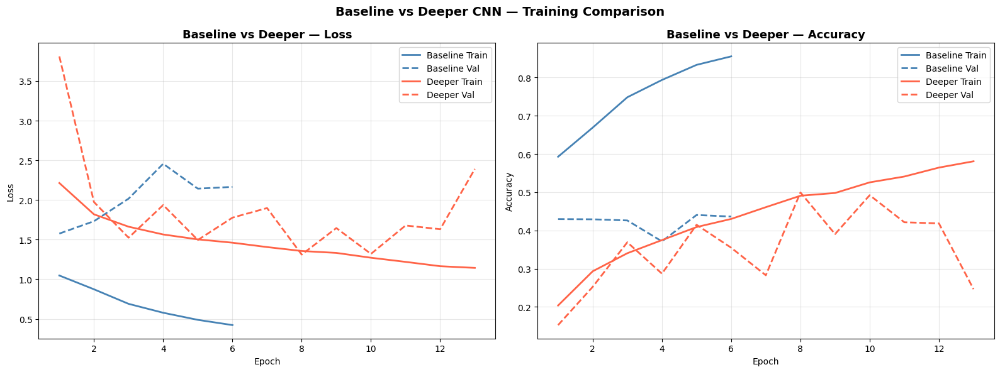

In [109]:
ep_base = range(1, len(history.history['loss']) + 1)
ep_deep = range(1, len(history_deep.history['loss']) + 1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

ax1.plot(ep_base, history.history['loss'],     label='Baseline Train', color='steelblue', lw=2)
ax1.plot(ep_base, history.history['val_loss'], label='Baseline Val',   color='steelblue', lw=2, ls='--')
ax1.plot(ep_deep, history_deep.history['loss'],     label='Deeper Train',   color='tomato',    lw=2)
ax1.plot(ep_deep, history_deep.history['val_loss'], label='Deeper Val',     color='tomato',    lw=2, ls='--')
ax1.set_title('Baseline vs Deeper — Loss', fontsize=13, fontweight='bold')
ax1.set_xlabel('Epoch'); ax1.set_ylabel('Loss')
ax1.legend(); ax1.grid(True, alpha=0.3)

ax2.plot(ep_base, history.history['accuracy'],     label='Baseline Train', color='steelblue', lw=2)
ax2.plot(ep_base, history.history['val_accuracy'], label='Baseline Val',   color='steelblue', lw=2, ls='--')
ax2.plot(ep_deep, history_deep.history['accuracy'],     label='Deeper Train',   color='tomato',    lw=2)
ax2.plot(ep_deep, history_deep.history['val_accuracy'], label='Deeper Val',     color='tomato',    lw=2, ls='--')
ax2.set_title('Baseline vs Deeper — Accuracy', fontsize=13, fontweight='bold')
ax2.set_xlabel('Epoch'); ax2.set_ylabel('Accuracy')
ax2.legend(); ax2.grid(True, alpha=0.3)

plt.suptitle('Baseline vs Deeper CNN — Training Comparison', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

Deeper Model — Test Accuracy: 49.50%  | Test Loss: 1.3178
                precision    recall  f1-score   support

  Chinee_apple     0.2946    0.1460    0.1953       226
       Lantana     0.3883    0.5305    0.4484       213
   Parkinsonia     0.4524    0.8502    0.5906       207
    Parthenium     0.4900    0.2390    0.3213       205
Prickly_acacia     0.7514    0.6103    0.6736       213
   Rubber_vine     0.4635    0.6287    0.5336       202
     Siam_weed     0.6054    0.8279    0.6994       215
    Snake_weed     0.5385    0.1373    0.2188       204

      accuracy                         0.4950      1685
     macro avg     0.4980    0.4963    0.4601      1685
  weighted avg     0.4968    0.4950    0.4594      1685



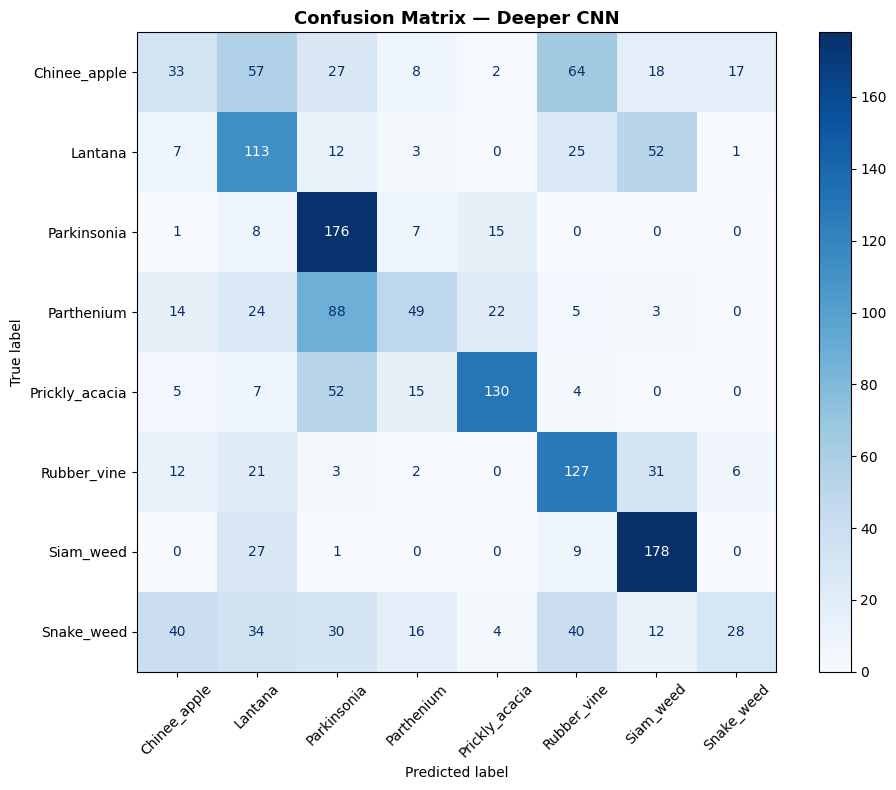

In [111]:
deep_loss, deep_acc = model_deep.evaluate(test_ds, verbose=0)
print(f"Deeper Model — Test Accuracy: {deep_acc*100:.2f}%  | Test Loss: {deep_loss:.4f}")

y_true_d = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_d = np.argmax(model_deep.predict(test_ds, verbose=0), axis=1)

print(classification_report(y_true_d, y_pred_d, target_names=class_names, digits=4))

cm_d = confusion_matrix(y_true_d, y_pred_d)
fig, ax = plt.subplots(figsize=(10, 8))
ConfusionMatrixDisplay(confusion_matrix=cm_d, display_labels=class_names).plot(
    ax=ax, cmap='Blues', colorbar=True, xticks_rotation=45)
ax.set_title('Confusion Matrix — Deeper CNN', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

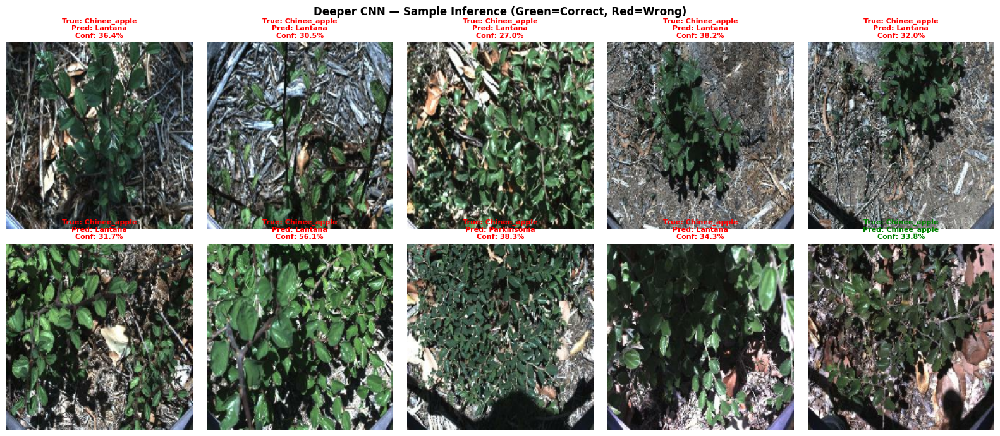

In [112]:
sample_images, sample_labels = next(iter(test_ds))
sample_preds_d = model_deep.predict(sample_images, verbose=0)

fig, axes = plt.subplots(2, 5, figsize=(16, 7))
axes = axes.flatten()
for i in range(10):
    true_label = class_names[sample_labels[i]]
    pred_label = class_names[np.argmax(sample_preds_d[i])]
    confidence = np.max(sample_preds_d[i]) * 100
    axes[i].imshow(sample_images[i].numpy())
    axes[i].axis('off')
    axes[i].set_title(
        f"True: {true_label}\nPred: {pred_label}\nConf: {confidence:.1f}%",
        fontsize=8, color='green' if true_label==pred_label else 'red', fontweight='bold'
    )
plt.suptitle('Deeper CNN — Sample Inference (Green=Correct, Red=Wrong)',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

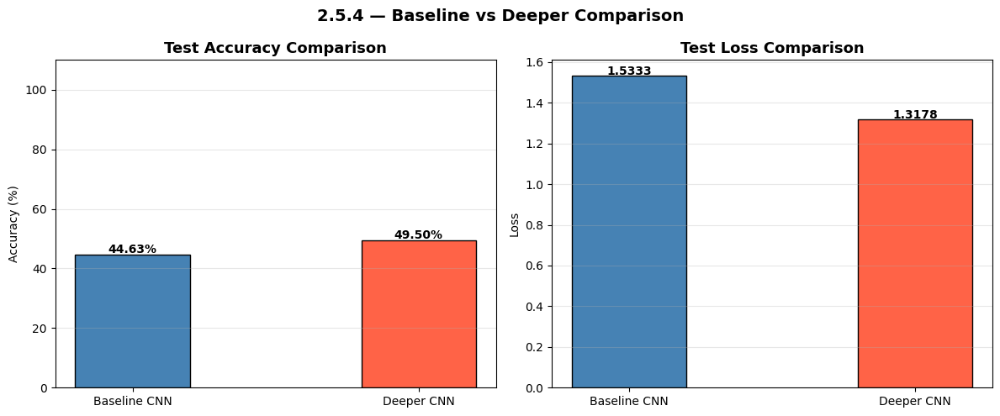

In [113]:
base_loss, base_acc = model.evaluate(test_ds, verbose=0)

labels  = ['Baseline CNN', 'Deeper CNN']
accs    = [base_acc*100,   deep_acc*100]
losses  = [base_loss,      deep_loss]
colors  = ['steelblue',    'tomato']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

bars1 = ax1.bar(labels, accs, color=colors, edgecolor='black', width=0.4)
ax1.set_title('Test Accuracy Comparison', fontsize=13, fontweight='bold')
ax1.set_ylabel('Accuracy (%)'); ax1.set_ylim(0, 110); ax1.grid(axis='y', alpha=0.3)
for bar, v in zip(bars1, accs):
    ax1.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{v:.2f}%', ha='center', fontweight='bold')

bars2 = ax2.bar(labels, losses, color=colors, edgecolor='black', width=0.4)
ax2.set_title('Test Loss Comparison', fontsize=13, fontweight='bold')
ax2.set_ylabel('Loss'); ax2.grid(axis='y', alpha=0.3)
for bar, v in zip(bars2, losses):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.005,
             f'{v:.4f}', ha='center', fontweight='bold')

plt.suptitle('2.5.4 — Baseline vs Deeper Comparison', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

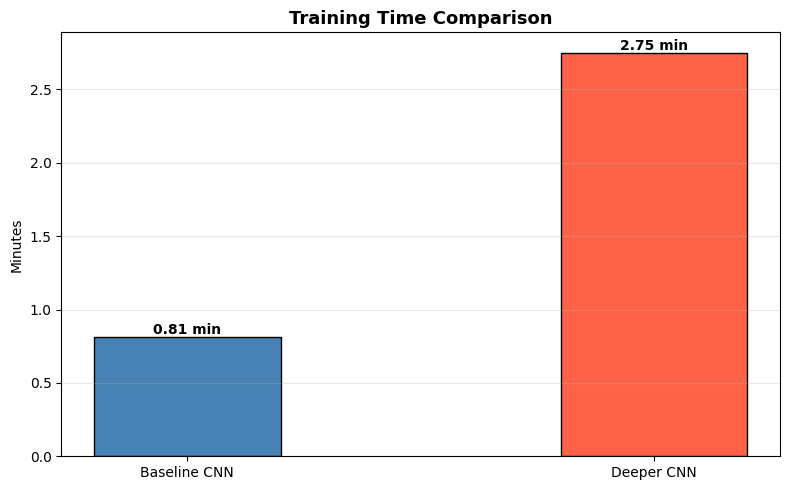

In [114]:
fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(['Baseline CNN', 'Deeper CNN'],
              [time_base/60, time_deep/60],
              color=['steelblue', 'tomato'], edgecolor='black', width=0.4)
ax.set_title('Training Time Comparison', fontsize=13, fontweight='bold')
ax.set_ylabel('Minutes'); ax.grid(axis='y', alpha=0.3)
for bar, v in zip(bars, [time_base/60, time_deep/60]):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.02,
            f'{v:.2f} min', ha='center', fontweight='bold')
plt.tight_layout()
plt.show()

In [124]:
# SGD Model — identical architecture
model_deep_sgd = Sequential([
    Conv2D(32, (3,3), padding='same', activation=None, input_shape=(224,224,3)),
    BatchNormalization(), Activation('relu'), MaxPooling2D((2,2)), Dropout(0.25),

    Conv2D(64, (3,3), padding='same', activation=None),
    BatchNormalization(), Activation('relu'), MaxPooling2D((2,2)), Dropout(0.25),

    Conv2D(128, (3,3), padding='same', activation=None),
    BatchNormalization(), Activation('relu'), MaxPooling2D((2,2)), Dropout(0.25),

    Conv2D(256, (3,3), padding='same', activation=None),
    BatchNormalization(), Activation('relu'), MaxPooling2D((2,2)), Dropout(0.25),

    Flatten(),
    Dense(512, activation=None), BatchNormalization(), Activation('relu'), Dropout(0.5),
    Dense(256, activation=None), BatchNormalization(), Activation('relu'), Dropout(0.5),
    Dense(128, activation=None), BatchNormalization(), Activation('relu'), Dropout(0.5),
    Dense(64,  activation=None), BatchNormalization(), Activation('relu'), Dropout(0.5),
    Dense(num_classes, activation='softmax')
], name='Deeper_CNN_SGD')

model_deep_sgd.compile(
    optimizer=SGD(learning_rate=0.1, momentum=0.9, nesterov=True),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)
model_deep_sgd.summary()

Model: "Deeper_CNN_SGD"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_32 (Conv2D)              │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_46          │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_40 (Activation)      │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_26 (MaxPooling2D) │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_50 (Dropout)            │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_33 (Conv2D)              │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_47          │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_41 (Activation)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_27 (MaxPooling2D) │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_51 (Dropout)            │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_34 (Conv2D)              │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_48          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_42 (Activation)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_52 (Dropout)            │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_35 (Conv2D)              │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_49          │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_43 (Activation)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_53 (Dropout)            │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 50176)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 512)            │    25,690,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_50          │ (None, 512)            │         2,04

 Total params: 26,257,800 (100.17 MB)

 Trainable params: 26,254,920 (100.15 MB)

 Non-trainable params: 2,880 (11.25 KB)

In [125]:
# Train SGD
t0_sgd = time.time()
history_sgd = model_deep_sgd.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)]
)
time_sgd = time.time() - t0_sgd
print(f"SGD training time: {time_sgd/60:.2f} minutes")

Epoch 1/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - accuracy: 0.1940 - loss: 2.1098 - val_accuracy: 0.1952 - val_loss: 2.3548
Epoch 2/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 10s 30ms/step - accuracy: 0.2738 - loss: 1.7793 - val_accuracy: 0.1208 - val_loss: 3.4625
Epoch 3/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - accuracy: 0.2797 - loss: 1.7710 - val_accuracy: 0.2946 - val_loss: 1.8631
Epoch 4/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - accuracy: 0.2663 - loss: 1.8030 - val_accuracy: 0.2881 - val_loss: 1.7767
Epoch 5/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - accuracy: 0.2781 - loss: 1.7576 - val_accuracy: 0.2351 - val_loss: 2.2978
Epoch 6/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - accuracy: 0.2638 - loss: 1.7875 - val_accuracy: 0.2327 - val_loss: 1.9160
Epoch 7/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - accuracy: 0.2595 - loss: 1.7905 - val_accuracy: 0.3679 - val_loss: 1.6462
Epoch 8/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - accuracy: 0.2537 - loss: 1.7946 - 

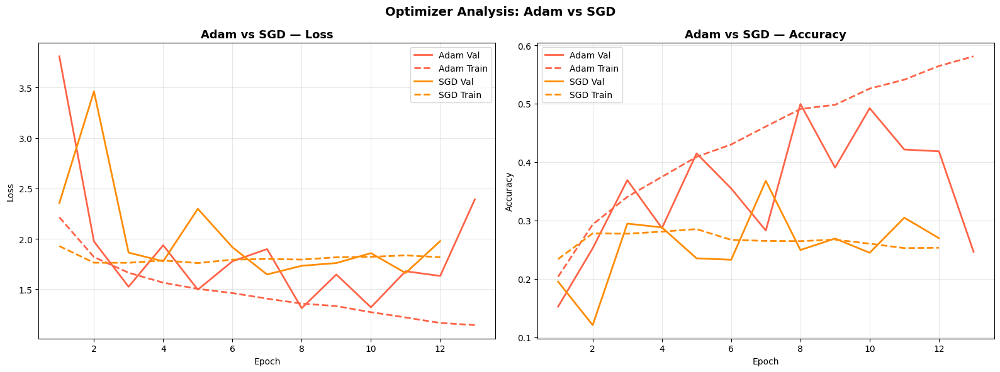

Adam training time: 2.75 min
SGD  training time: 2.32 min


In [126]:
# SGD vs Adam curves
ep_adam = range(1, len(history_deep.history['loss']) + 1)
ep_sgd  = range(1, len(history_sgd.history['loss'])  + 1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
ax1.plot(ep_adam, history_deep.history['val_loss'], label='Adam Val', color='tomato',    lw=2)
ax1.plot(ep_adam, history_deep.history['loss'],     label='Adam Train',color='tomato',   lw=2, ls='--')
ax1.plot(ep_sgd,  history_sgd.history['val_loss'],  label='SGD Val',  color='darkorange', lw=2)
ax1.plot(ep_sgd,  history_sgd.history['loss'],      label='SGD Train', color='darkorange',lw=2, ls='--')
ax1.set_title('Adam vs SGD — Loss', fontsize=13, fontweight='bold')
ax1.set_xlabel('Epoch'); ax1.set_ylabel('Loss'); ax1.legend(); ax1.grid(alpha=0.3)

ax2.plot(ep_adam, history_deep.history['val_accuracy'], label='Adam Val', color='tomato',    lw=2)
ax2.plot(ep_adam, history_deep.history['accuracy'],     label='Adam Train',color='tomato',   lw=2, ls='--')
ax2.plot(ep_sgd,  history_sgd.history['val_accuracy'],  label='SGD Val',  color='darkorange', lw=2)
ax2.plot(ep_sgd,  history_sgd.history['accuracy'],      label='SGD Train', color='darkorange',lw=2, ls='--')
ax2.set_title('Adam vs SGD — Accuracy', fontsize=13, fontweight='bold')
ax2.set_xlabel('Epoch'); ax2.set_ylabel('Accuracy'); ax2.legend(); ax2.grid(alpha=0.3)

plt.suptitle('Optimizer Analysis: Adam vs SGD', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Adam training time: {time_deep/60:.2f} min")
print(f"SGD  training time: {time_sgd/60:.2f} min")

In [130]:
deep_model2 = Sequential([

    # Block 1
    layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.001),
                  input_shape=(224,224,3)),
    layers.BatchNormalization(),
    layers.LeakyReLU(alpha=0.1),
    layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.LeakyReLU(alpha=0.1),
    layers.MaxPooling2D(),
    layers.Dropout(0.3),

    # Block 2
    layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.LeakyReLU(alpha=0.1),
    layers.Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.LeakyReLU(alpha=0.1),
    layers.MaxPooling2D(),
    layers.Dropout(0.3),

    # Block 3
    layers.Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.LeakyReLU(alpha=0.1),
    layers.Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(0.001)),
    layers.BatchNormalization(),
    layers.LeakyReLU(alpha=0.1),
    layers.MaxPooling2D(),
    layers.Dropout(0.3),

    layers.GlobalAveragePooling2D(),

    # FCN Layer 1
    layers.Dense(256, kernel_regularizer=regularizers.l2(0.001)),
    layers.LeakyReLU(alpha=0.1),
    layers.Dropout(0.5),

    # FCN Layer 2
    layers.Dense(128, kernel_regularizer=regularizers.l2(0.001)),
    layers.LeakyReLU(alpha=0.1),
    layers.Dropout(0.3),

    # FCN Layer 3
    layers.Dense(64, kernel_regularizer=regularizers.l2(0.001)),
    layers.LeakyReLU(alpha=0.1),

    # Output
    layers.Dense(num_classes, activation='softmax')
])

deep_model2.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_54 (Conv2D)              │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_72          │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_27 (LeakyReLU)      │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_55 (Conv2D)              │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_73          │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_28 (LeakyReLU)      │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_39 (MaxPooling2D) │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_73 (Dropout)            │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_56 (Conv2D)              │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_74          │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_29 (LeakyReLU)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_57 (Conv2D)              │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_75          │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_30 (LeakyReLU)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_40 (MaxPooling2D) │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_74 (Dropout)            │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_58 (Conv2D)              │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_76          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_31 (LeakyReLU)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_59 (Conv2D)              │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_77          │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 56, 56, 128)    │             

 Total params: 363,496 (1.39 MB)

 Trainable params: 362,600 (1.38 MB)

 Non-trainable params: 896 (3.50 KB)

In [131]:
import tensorflow as tf

early_stop = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.3,
    patience=3,
    min_lr=1e-6
)
deep_model2.compile(
    optimizer=tf.keras.optimizers.AdamW(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history_deep2 = deep_model2.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
    callbacks=[early_stop, lr_scheduler]
)

Epoch 1/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 37s 76ms/step - accuracy: 0.2650 - loss: 2.5525 - val_accuracy: 0.1345 - val_loss: 5.0636 - learning_rate: 0.0010
Epoch 2/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 15s 46ms/step - accuracy: 0.3783 - loss: 2.0025 - val_accuracy: 0.2810 - val_loss: 2.0888 - learning_rate: 0.0010
Epoch 3/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step - accuracy: 0.4108 - loss: 1.8376 - val_accuracy: 0.3798 - val_loss: 1.9358 - learning_rate: 0.0010
Epoch 4/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step - accuracy: 0.4439 - loss: 1.7513 - val_accuracy: 0.2982 - val_loss: 2.1995 - learning_rate: 0.0010
Epoch 5/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step - accuracy: 0.4619 - loss: 1.6668 - val_accuracy: 0.3792 - val_loss: 1.8653 - learning_rate: 0.0010
Epoch 6/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step - accuracy: 0.4689 - loss: 1.6310 - val_accuracy: 0.3423 - val_loss: 2.0386 - learning_rate: 0.0010
Epoch 7/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step - accuracy: 0.4790 - l

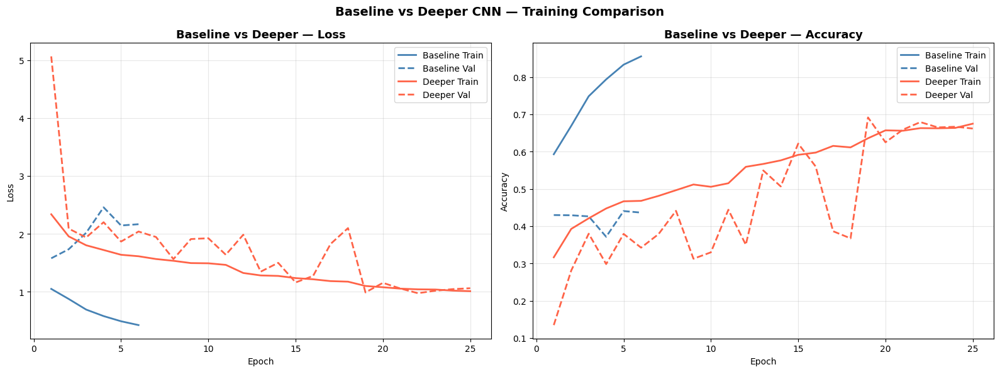

Baseline training time : 0.81 minutes
Deeper  training time  : 2.75 minutes


In [132]:
ep_base = range(1, len(history.history['loss']) + 1)
ep_deep = range(1, len(history_deep2.history['loss']) + 1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

ax1.plot(ep_base, history.history['loss'],     label='Baseline Train', color='steelblue', lw=2)
ax1.plot(ep_base, history.history['val_loss'], label='Baseline Val',   color='steelblue', lw=2, ls='--')
ax1.plot(ep_deep, history_deep2.history['loss'],     label='Deeper Train',   color='tomato',    lw=2)
ax1.plot(ep_deep, history_deep2.history['val_loss'], label='Deeper Val',     color='tomato',    lw=2, ls='--')
ax1.set_title('Baseline vs Deeper — Loss', fontsize=13, fontweight='bold')
ax1.set_xlabel('Epoch'); ax1.set_ylabel('Loss')
ax1.legend(); ax1.grid(True, alpha=0.3)

ax2.plot(ep_base, history.history['accuracy'],     label='Baseline Train', color='steelblue', lw=2)
ax2.plot(ep_base, history.history['val_accuracy'], label='Baseline Val',   color='steelblue', lw=2, ls='--')
ax2.plot(ep_deep, history_deep2.history['accuracy'],     label='Deeper Train',   color='tomato',    lw=2)
ax2.plot(ep_deep, history_deep2.history['val_accuracy'], label='Deeper Val',     color='tomato',    lw=2, ls='--')
ax2.set_title('Baseline vs Deeper — Accuracy', fontsize=13, fontweight='bold')
ax2.set_xlabel('Epoch'); ax2.set_ylabel('Accuracy')
ax2.legend(); ax2.grid(True, alpha=0.3)

plt.suptitle('Baseline vs Deeper CNN — Training Comparison', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Baseline training time : {time_base/60:.2f} minutes")
print(f"Deeper  training time  : {time_deep/60:.2f} minutes")

In [133]:
deep_loss, deep_acc = deep_model2.evaluate(test_ds, verbose=0)
print("=" * 55)
print("DEEPER CNN — MODEL EVALUATION")
print("=" * 55)
print(f"  Test Accuracy : {deep_acc*100:.2f}%")
print(f"  Test Loss     : {deep_loss:.4f}")
print("=" * 55)

y_true_d2 = np.concatenate([y for x, y in test_ds], axis=0)
y_pred_d2 = np.argmax(deep_model2.predict(test_ds, verbose=0), axis=1)

print("\nClassification Report:")
print(classification_report(y_true_d2, y_pred_d2, target_names=class_names, digits=4))

DEEPER CNN — MODEL EVALUATION
  Test Accuracy : 67.30%
  Test Loss     : 1.0038

Classification Report:
                precision    recall  f1-score   support

  Chinee_apple     0.4789    0.4027    0.4375       226
       Lantana     0.5663    0.8216    0.6705       213
   Parkinsonia     0.7154    0.8986    0.7966       207
    Parthenium     0.5974    0.6732    0.6330       205
Prickly_acacia     0.7826    0.7606    0.7714       213
   Rubber_vine     0.9295    0.7178    0.8101       202
     Siam_weed     0.8436    0.8279    0.8357       215
    Snake_weed     0.4876    0.2892    0.3631       204

      accuracy                         0.6730      1685
     macro avg     0.6752    0.6739    0.6647      1685
  weighted avg     0.6734    0.6730    0.6635      1685



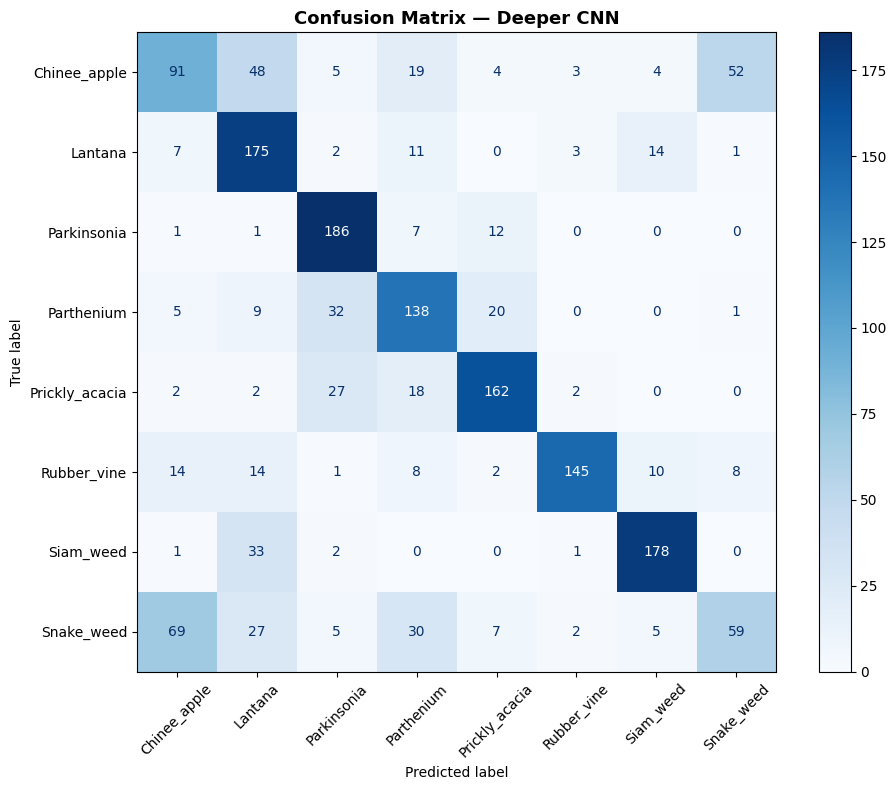

In [134]:
cm_d = confusion_matrix(y_true_d2, y_pred_d2)
fig, ax = plt.subplots(figsize=(10, 8))
ConfusionMatrixDisplay(confusion_matrix=cm_d, display_labels=class_names).plot(
    ax=ax, cmap='Blues', colorbar=True, xticks_rotation=45)
ax.set_title('Confusion Matrix — Deeper CNN', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

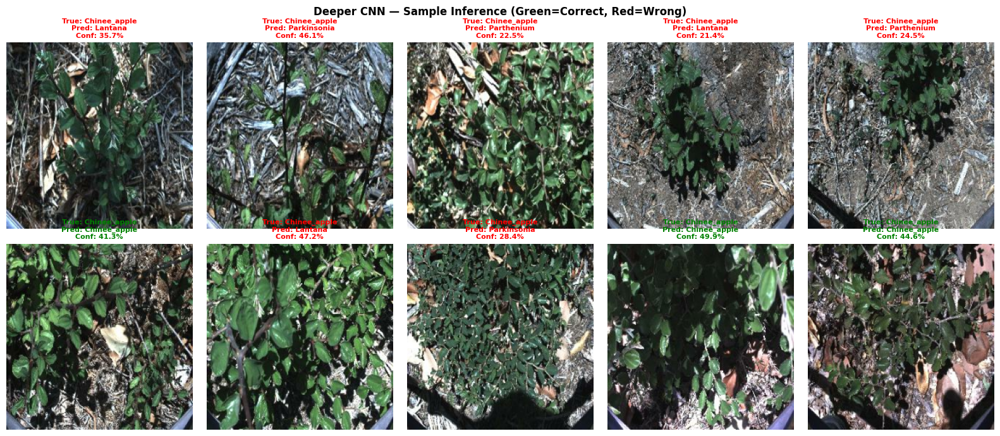

In [135]:
sample_images, sample_labels = next(iter(test_ds))
sample_preds_d = deep_model2.predict(sample_images, verbose=0)

fig, axes = plt.subplots(2, 5, figsize=(16, 7))
axes = axes.flatten()
for i in range(10):
    true_label = class_names[sample_labels[i]]
    pred_label = class_names[np.argmax(sample_preds_d[i])]
    confidence = np.max(sample_preds_d[i]) * 100
    axes[i].imshow(sample_images[i].numpy())
    axes[i].axis('off')
    axes[i].set_title(
        f"True: {true_label}\nPred: {pred_label}\nConf: {confidence:.1f}%",
        fontsize=8, color='green' if true_label==pred_label else 'red',
        fontweight='bold'
    )
plt.suptitle('Deeper CNN — Sample Inference (Green=Correct, Red=Wrong)',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

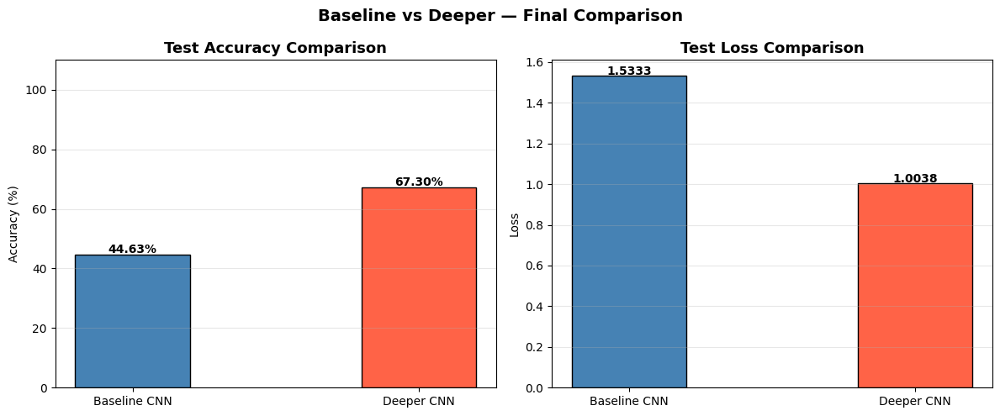

In [136]:
base_loss, base_acc = model.evaluate(test_ds, verbose=0)

labels = ['Baseline CNN', 'Deeper CNN']
accs   = [base_acc*100,   deep_acc*100]
losses = [base_loss,      deep_loss]
colors = ['steelblue',    'tomato']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

bars1 = ax1.bar(labels, accs, color=colors, edgecolor='black', width=0.4)
ax1.set_title('Test Accuracy Comparison', fontsize=13, fontweight='bold')
ax1.set_ylabel('Accuracy (%)'); ax1.set_ylim(0, 110); ax1.grid(axis='y', alpha=0.3)
for bar, v in zip(bars1, accs):
    ax1.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.5,
             f'{v:.2f}%', ha='center', fontweight='bold')

bars2 = ax2.bar(labels, losses, color=colors, edgecolor='black', width=0.4)
ax2.set_title('Test Loss Comparison', fontsize=13, fontweight='bold')
ax2.set_ylabel('Loss'); ax2.grid(axis='y', alpha=0.3)
for bar, v in zip(bars2, losses):
    ax2.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.005,
             f'{v:.4f}', ha='center', fontweight='bold')

plt.suptitle('Baseline vs Deeper — Final Comparison', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [137]:
# Ablation — remove BatchNormalization
model_ablation = Sequential([
    Conv2D(32, (3,3), padding='same', activation='relu', input_shape=(224,224,3)),
    MaxPooling2D((2,2)), Dropout(0.25),

    Conv2D(64, (3,3), padding='same', activation='relu'),
    MaxPooling2D((2,2)), Dropout(0.25),

    Conv2D(128, (3,3), padding='same', activation='relu'),
    MaxPooling2D((2,2)), Dropout(0.25),

    Conv2D(256, (3,3), padding='same', activation='relu'),
    MaxPooling2D((2,2)), Dropout(0.25),

    Flatten(),
    Dense(512, activation='relu'), Dropout(0.5),
    Dense(256, activation='relu'), Dropout(0.5),
    Dense(128, activation='relu'), Dropout(0.5),
    Dense(64,  activation='relu'), Dropout(0.5),
    Dense(num_classes, activation='softmax')
], name='Ablation_NoBatchNorm')

model_ablation.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [139]:
# Train ablation
t0_abl = time.time()
history_ablation = model_ablation.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
    callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)]
)
time_abl = time.time() - t0_abl

abl_loss, abl_acc = model_ablation.evaluate(test_ds, verbose=0)
print(f"Ablation — Test Accuracy: {abl_acc*100:.2f}%  | Loss: {abl_loss:.4f}")
print(f"Deeper   — Test Accuracy: {deep_acc*100:.2f}%  | Loss: {deep_loss:.4f}")

Epoch 1/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - accuracy: 0.1415 - loss: 2.0792 - val_accuracy: 0.1339 - val_loss: 2.0789
Epoch 2/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - accuracy: 0.1446 - loss: 2.0785 - val_accuracy: 0.1339 - val_loss: 2.0789
Epoch 3/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - accuracy: 0.1436 - loss: 2.0786 - val_accuracy: 0.1339 - val_loss: 2.0789
Epoch 4/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 9s 27ms/step - accuracy: 0.1406 - loss: 2.0787 - val_accuracy: 0.1339 - val_loss: 2.0789
Epoch 5/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - accuracy: 0.1432 - loss: 2.0790 - val_accuracy: 0.1339 - val_loss: 2.0789
Epoch 6/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - accuracy: 0.1446 - loss: 2.0788 - val_accuracy: 0.1339 - val_loss: 2.0789
Epoch 7/25
315/315 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step - accuracy: 0.1380 - loss: 2.0788 - val_accuracy: 0.1339 - val_loss: 2.0789
Ablation — Test Accuracy: 13.41%  | Loss: 2.0789
Deeper   — Test Accuracy: 67.30%  | Loss: 1.0038

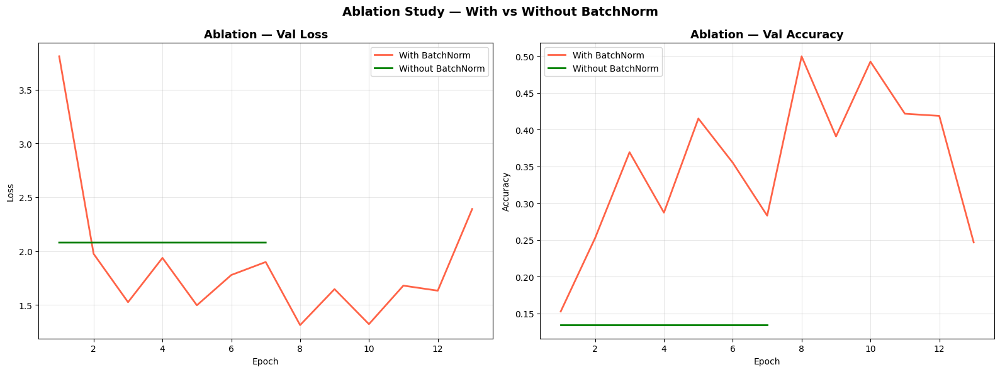

In [140]:
# Ablation comparison curves
ep_deep = range(1, len(history_deep.history['loss']) + 1)
ep_abl  = range(1, len(history_ablation.history['loss']) + 1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
ax1.plot(ep_deep, history_deep.history['val_loss'],      label='With BatchNorm',    color='tomato', lw=2)
ax1.plot(ep_abl,  history_ablation.history['val_loss'],  label='Without BatchNorm', color='green',  lw=2)
ax1.set_title('Ablation — Val Loss', fontsize=13, fontweight='bold')
ax1.set_xlabel('Epoch'); ax1.set_ylabel('Loss'); ax1.legend(); ax1.grid(alpha=0.3)

ax2.plot(ep_deep, history_deep.history['val_accuracy'],     label='With BatchNorm',    color='tomato', lw=2)
ax2.plot(ep_abl,  history_ablation.history['val_accuracy'], label='Without BatchNorm', color='green',  lw=2)
ax2.set_title('Ablation — Val Accuracy', fontsize=13, fontweight='bold')
ax2.set_xlabel('Epoch'); ax2.set_ylabel('Accuracy'); ax2.legend(); ax2.grid(alpha=0.3)

plt.suptitle('Ablation Study — With vs Without BatchNorm', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

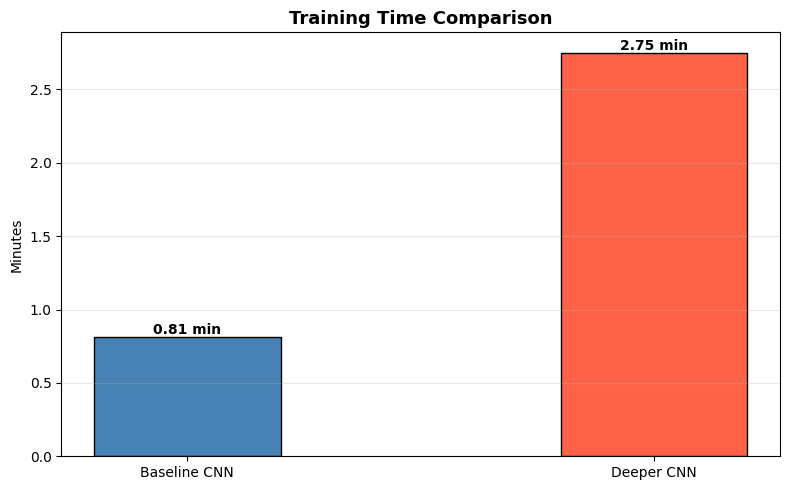

In [141]:
fig, ax = plt.subplots(figsize=(8, 5))
bars = ax.bar(['Baseline CNN', 'Deeper CNN'],
              [time_base/60,    time_deep/60],
              color=['steelblue', 'tomato'], edgecolor='black', width=0.4)
ax.set_title('Training Time Comparison', fontsize=13, fontweight='bold')
ax.set_ylabel('Minutes'); ax.grid(axis='y', alpha=0.3)
for bar, v in zip(bars, [time_base/60, time_deep/60]):
    ax.text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.02,
            f'{v:.2f} min', ha='center', fontweight='bold')
plt.tight_layout()
plt.show()

In [143]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2

In [144]:
base_model = MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,   
    weights='imagenet'
)

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [145]:
base_model.trainable = False

In [146]:
model_tl = models.Sequential([
    base_model,

    layers.GlobalAveragePooling2D(),

    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),

    layers.Dense(num_classes, activation='softmax')  # 8 classes
])

In [147]:
model_tl.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model_tl.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_86 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 8)              │         2,056 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,587,976 (9.87 MB)

 Trainable params: 329,992 (1.26 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [148]:
history_tl = model_tl.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10
)

Epoch 1/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 34s 62ms/step - accuracy: 0.5000 - loss: 1.4330 - val_accuracy: 0.7417 - val_loss: 0.7079
Epoch 2/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.7220 - loss: 0.7751 - val_accuracy: 0.7935 - val_loss: 0.5907
Epoch 3/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.7703 - loss: 0.6472 - val_accuracy: 0.7952 - val_loss: 0.5574
Epoch 4/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.7855 - loss: 0.5867 - val_accuracy: 0.8042 - val_loss: 0.5253
Epoch 5/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.8087 - loss: 0.5315 - val_accuracy: 0.7988 - val_loss: 0.5406
Epoch 6/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.8221 - loss: 0.4723 - val_accuracy: 0.8143 - val_loss: 0.5217
Epoch 7/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.8441 - loss: 0.4309 - val_accuracy: 0.8077 - val_loss: 0.5266
Epoch 8/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.8497 - loss: 0.4086 - val_acc

In [149]:
# Unfreeze top layers only
base_model.trainable = True

# Freeze lower layers, unfreeze top layers
for layer in base_model.layers[:-30]:
    layer.trainable = False

In [150]:
model_tl.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),  # 🔻 lower LR
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [151]:
history_ft = model_tl.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10
)

Epoch 1/10


2026-05-05 15:10:50.527080: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-05 15:10:50.722793: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


311/315 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - accuracy: 0.5842 - loss: 1.6979

2026-05-05 15:11:05.513153: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-05-05 15:11:05.708762: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


315/315 ━━━━━━━━━━━━━━━━━━━━ 39s 68ms/step - accuracy: 0.5848 - loss: 1.6931 - val_accuracy: 0.8173 - val_loss: 0.6017
Epoch 2/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - accuracy: 0.6937 - loss: 0.9351 - val_accuracy: 0.8179 - val_loss: 0.6022
Epoch 3/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - accuracy: 0.7487 - loss: 0.7222 - val_accuracy: 0.8220 - val_loss: 0.5712
Epoch 4/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - accuracy: 0.7810 - loss: 0.6446 - val_accuracy: 0.8226 - val_loss: 0.5308
Epoch 5/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - accuracy: 0.7932 - loss: 0.5637 - val_accuracy: 0.8280 - val_loss: 0.5057
Epoch 6/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - accuracy: 0.8381 - loss: 0.4855 - val_accuracy: 0.8315 - val_loss: 0.4839
Epoch 7/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - accuracy: 0.8448 - loss: 0.4434 - val_accuracy: 0.8363 - val_loss: 0.4717
Epoch 8/10
315/315 ━━━━━━━━━━━━━━━━━━━━ 8s 26ms/step - accuracy: 0.8626 - loss: 0.3925 - val_accuracy: 0.84

In [152]:
test_loss, test_acc = model_tl.evaluate(test_ds)

print("Test Accuracy:", test_acc)
print("Test Loss:", test_loss)

106/106 ━━━━━━━━━━━━━━━━━━━━ 8s 76ms/step - accuracy: 0.7964 - loss: 0.5771
Test Accuracy: 0.8338279128074646
Test Loss: 0.48148396611213684


In [153]:
from sklearn.metrics import classification_report
import numpy as np

y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model_tl.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

print(classification_report(y_true, y_pred, target_names=class_names))

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━

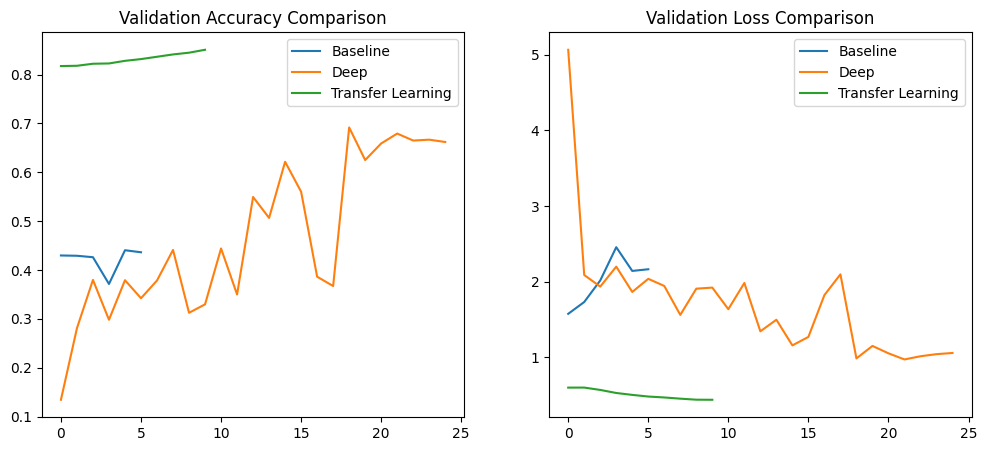

In [154]:
plt.figure(figsize=(12,5))

# Accuracy
plt.subplot(1,2,1)
plt.plot(history.history['val_accuracy'], label='Baseline')
plt.plot(history_deep2.history['val_accuracy'], label='Deep')
plt.plot(history_ft.history['val_accuracy'], label='Transfer Learning')
plt.title("Validation Accuracy Comparison")
plt.legend()

# Loss
plt.subplot(1,2,2)
plt.plot(history.history['val_loss'], label='Baseline')
plt.plot(history_deep2.history['val_loss'], label='Deep')
plt.plot(history_ft.history['val_loss'], label='Transfer Learning')
plt.title("Validation Loss Comparison")
plt.legend()

plt.show()

In [155]:
model.save('model_baseline.keras')
model_deep.save('model_adam.keras')
model_deep_sgd.save('model_sgd.keras')
model_tl.save('model_tl.keras')  # uncomment when transfer learning is done

In [157]:
from tensorflow.keras.models import load_model

model_baseline = load_model('model_baseline.keras')
model_adam     = load_model('model_adam.keras')
model_sgd      = load_model('model_sgd.keras')
model_pretrained = load_model('model_tl.keras') 

In [163]:
# Get true labels
y_true = np.concatenate([y for x, y in test_ds], axis=0)

# Predict with all models
preds_baseline = model_baseline.predict(test_ds, verbose=0)
preds_adam     = model_adam.predict(test_ds,     verbose=0)
preds_sgd      = model_sgd.predict(test_ds,      verbose=0)
preds_tl       = model_pretrained.predict(test_ds, verbose=0)  # ← .predict() not ()

# Get predicted class indices
pred_baseline_idx = np.argmax(preds_baseline, axis=1)
pred_adam_idx     = np.argmax(preds_adam,     axis=1)
pred_sgd_idx      = np.argmax(preds_sgd,      axis=1)
pred_tl_idx       = np.argmax(preds_tl,       axis=1)

# Map to class names
pred_baseline_names = [class_names[i] for i in pred_baseline_idx]
pred_adam_names     = [class_names[i] for i in pred_adam_idx]
pred_sgd_names      = [class_names[i] for i in pred_sgd_idx]
pred_tl_names       = [class_names[i] for i in pred_tl_idx]
true_names          = [class_names[i] for i in y_true]

print(f"Total test predictions: {len(true_names)}")

Total test predictions: 1685


In [164]:
import random

random_indices = random.sample(range(len(true_names)), 10)

print("=" * 65)
print("SAMPLE PREDICTIONS — All Models")
print("=" * 65)
for i in random_indices:
    correct_b  = "✓" if pred_baseline_names[i] == true_names[i] else "✗"
    correct_a  = "✓" if pred_adam_names[i]      == true_names[i] else "✗"
    correct_s  = "✓" if pred_sgd_names[i]       == true_names[i] else "✗"
    correct_tl = "✓" if pred_tl_names[i]        == true_names[i] else "✗"

    print(f"True Label  : {true_names[i]}")
    print(f"  Baseline  : {pred_baseline_names[i]}  {correct_b}")
    print(f"  Adam      : {pred_adam_names[i]}  {correct_a}")
    print(f"  SGD       : {pred_sgd_names[i]}  {correct_s}")
    print(f"  Pretrained: {pred_tl_names[i]}  {correct_tl}")
    print("-" * 65)

SAMPLE PREDICTIONS — All Models
True Label  : Parthenium
  Baseline  : Parkinsonia  ✗
  Adam      : Parkinsonia  ✗
  SGD       : Prickly_acacia  ✗
  Pretrained: Prickly_acacia  ✗
-----------------------------------------------------------------
True Label  : Prickly_acacia
  Baseline  : Prickly_acacia  ✓
  Adam      : Parkinsonia  ✗
  SGD       : Prickly_acacia  ✓
  Pretrained: Prickly_acacia  ✓
-----------------------------------------------------------------
True Label  : Parkinsonia
  Baseline  : Parkinsonia  ✓
  Adam      : Parkinsonia  ✓
  SGD       : Prickly_acacia  ✗
  Pretrained: Parkinsonia  ✓
-----------------------------------------------------------------
True Label  : Chinee_apple
  Baseline  : Chinee_apple  ✓
  Adam      : Parkinsonia  ✗
  SGD       : Snake_weed  ✗
  Pretrained: Chinee_apple  ✓
-----------------------------------------------------------------
True Label  : Lantana
  Baseline  : Lantana  ✓
  Adam      : Lantana  ✓
  SGD       : Lantana  ✓
  Pretrained: Lan

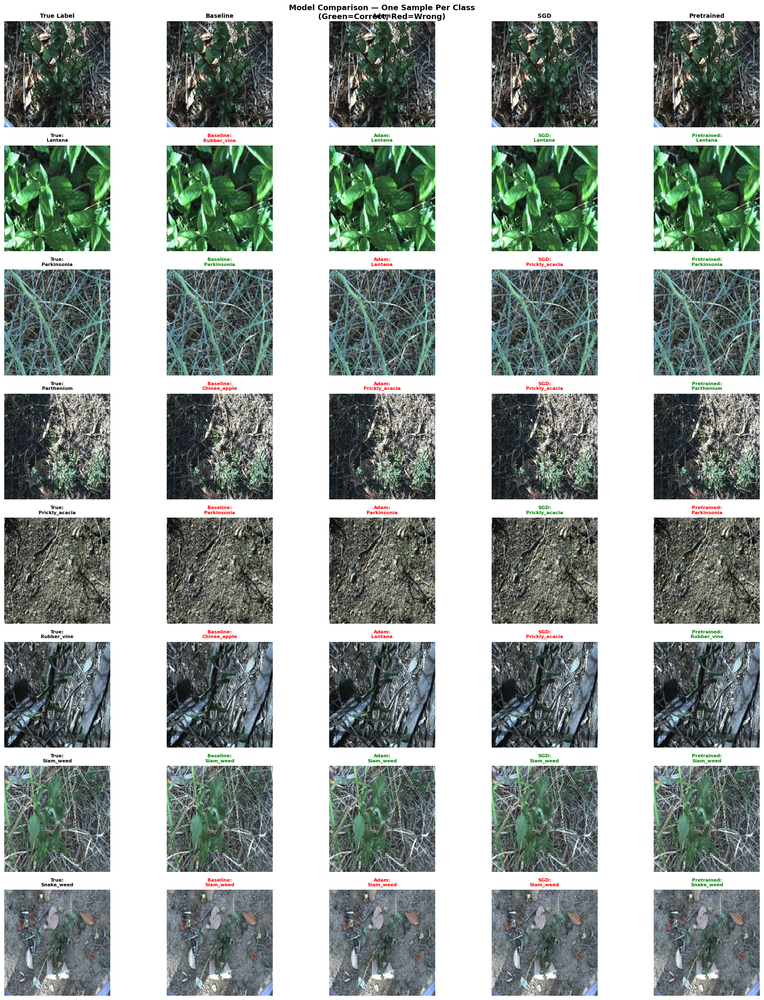

In [167]:
# Collect one image per class from test_ds
collected_images = {}
collected_labels = {}

for images, labels in test_ds:
    for i in range(len(labels)):
        label_idx = labels[i].numpy()
        cls_name  = class_names[label_idx]
        if cls_name not in collected_images:
            collected_images[cls_name] = images[i]
            collected_labels[cls_name] = label_idx
        if len(collected_images) == num_classes:
            break
    if len(collected_images) == num_classes:
        break

# Stack into batch
sample_images = tf.stack(list(collected_images.values()))
sample_labels = list(collected_labels.values())

# Predict with all models
preds_b  = model_baseline.predict(sample_images,   verbose=0)
preds_a  = model_adam.predict(sample_images,       verbose=0)
preds_s  = model_sgd.predict(sample_images,        verbose=0)
preds_tl = model_pretrained.predict(sample_images, verbose=0)

n_show = num_classes  # show one image per class = 8
fig, axes = plt.subplots(n_show, 5, figsize=(20, n_show * 3))

for i in range(n_show):
    true_lbl = class_names[sample_labels[i]]
    pred_b   = class_names[np.argmax(preds_b[i])]
    pred_a   = class_names[np.argmax(preds_a[i])]
    pred_s   = class_names[np.argmax(preds_s[i])]
    pred_tl  = class_names[np.argmax(preds_tl[i])]

    # True Image
    axes[i, 0].imshow(sample_images[i].numpy())
    axes[i, 0].axis('off')
    axes[i, 0].set_title(f"True:\n{true_lbl}", fontsize=8,
                          fontweight='bold', color='black')

    # Baseline
    axes[i, 1].imshow(sample_images[i].numpy())
    axes[i, 1].axis('off')
    axes[i, 1].set_title(f"Baseline:\n{pred_b}", fontsize=8, fontweight='bold',
                          color='green' if pred_b==true_lbl else 'red')

    # Adam
    axes[i, 2].imshow(sample_images[i].numpy())
    axes[i, 2].axis('off')
    axes[i, 2].set_title(f"Adam:\n{pred_a}", fontsize=8, fontweight='bold',
                          color='green' if pred_a==true_lbl else 'red')

    # SGD
    axes[i, 3].imshow(sample_images[i].numpy())
    axes[i, 3].axis('off')
    axes[i, 3].set_title(f"SGD:\n{pred_s}", fontsize=8, fontweight='bold',
                          color='green' if pred_s==true_lbl else 'red')

    # Pretrained
    axes[i, 4].imshow(sample_images[i].numpy())
    axes[i, 4].axis('off')
    axes[i, 4].set_title(f"Pretrained:\n{pred_tl}", fontsize=8, fontweight='bold',
                          color='green' if pred_tl==true_lbl else 'red')

# Column headers
for ax, col in zip(axes[0], ['True Label', 'Baseline', 'Adam', 'SGD', 'Pretrained']):
    ax.set_title(col, fontsize=10, fontweight='bold', color='black')

plt.suptitle('Model Comparison — One Sample Per Class\n(Green=Correct, Red=Wrong)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()